# Principal Component Regression
The following notebook will illustrate the basics of feature scaling, preprocessing, and feature transformation using Principle Component Analysis, to finally predict the value of houses.

In this notebook we will start using the Sci-Kit learn package, which is a great and versatile open-source tool for Machine Learning with Python. It holds many regression and clasification algorithms, as well as great auxilliaries for preprocessing, validation, data splitting, performance metrics ....

If you never worked with sklearn before, you should have a look into the good documentation (we will provide links throughout this notebook). _And please do not forget to ask questions in our channels! We can only support you if we know that you are struggeling._

In [1]:
# load and show dataset
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
%matplotlib inline
set_matplotlib_formats('svg')
sns.set_style("darkgrid")

/Users/ppp/miniconda2/envs/dlmm-cpu/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Load and inspect the housing data.

In [2]:
data = pd.read_csv('housing.csv')
data.head()
data.info()
data['ocean_proximity'].unique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

We can see that one variable _ocean_proximity_ contains strings. Pandas loads this as an _object_. We should first tell pandas that this is a Categorical Variable. For our following tasks we need numerical values. The easiest (not neccessarily the best) way to encode a categorical variable is to do so called _integer coding_. So we assign each category an integer number.

In [3]:
data['ocean_proximity']= (data['ocean_proximity'].astype('category')).cat.codes
data['ocean_proximity'].unique()

array([3, 0, 1, 4, 2], dtype=int8)

__Task__: Next, we should check if there are any missing values!

In [4]:
### check if you find missing values in the dataframe
data.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

__Task__: If you found missing values, please handle the problem. Go for a simple solution. Missing value imputation is not topic of this notebook and we will do it once for the whole dataset. _(Please note that in a real project it is best practice to also validate the missing value imputiation!)_

In [5]:
### impute the missing values
data = data.fillna(data.mean())
data.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

__Task:__ Now we split the data. Use scikit learn's `train_test_split()` function and choose a reasonable test set size. ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html))

In [6]:
from sklearn.model_selection import train_test_split

X = data.drop(columns=['median_house_value'])
y = data.median_house_value

### split the data to end up with the following dataframes: X_train,X_test,y_train, y_test
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.33)



__Task:__ Due to the number of variables a apirplot/scatter-matrix would end up with toooooo many pair plots. But we can use a boxplot to gain information about the distribution and the ranges of our features. 

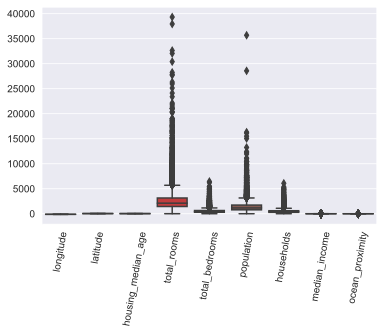

In [7]:
### perform a boxplot of X_train here
ax = sns.boxplot(data=X_train)
ax.set_xticklabels(ax.get_xticklabels(),rotation=80)
plt.show()

__Task__: The plot revealed that the features are not all in a common range of values. To scale the features we can use different methods. Here, we will use the sklearn `StandardScaler` object, which standardizes the data such that each column is zero-mean and the standard deviation is 1. In general most of the objects in sklearn provide functions depending on their purpose. In pre-processing this is mainly `.fit()` , `.fit_transform()`,`.transform()`, `.inverse_transform()`. ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html))
 
 (Remark: We should exclude our categorical integer coded feature from scaling. You can try to implement this by your own)

In [22]:
from sklearn.preprocessing import StandardScaler

xscaler = StandardScaler()
yscaler = StandardScaler()

### use the scaler objects defined above to scale the data

X_train_scaled = xscaler.fit_transform(X_train)
X_test_scaled = xscaler.transform(X_test)
y_train_scaled = yscaler.fit_transform(y_train.values.reshape(-1,1))
y_test_scaled = yscaler.transform(y_test.values.reshape(-1,1))
print(y_train.values.shape)
print(y_train.values.reshape(-1,1).shape)

(13828,)
(13828, 1)


__Task__:Repeat the boxplot but now with the standardized data.

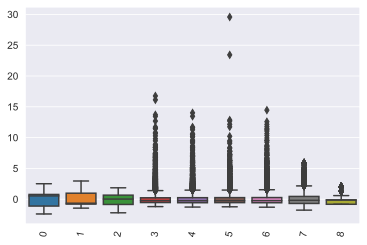

In [9]:
### perform a boxplot of X_train_scaled here
ax = sns.boxplot(data=X_train_scaled)
ax.set_xticklabels(ax.get_xticklabels(),rotation=80)
plt.show()

Let us check how good the data can be predicted by a simple linear regression ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)). Instead of computing the regression coefficients by hand, we will use sklearn and get to know the most important functions of a estimator object, namely `.fit()` and `.predict()`. Furthermore we use the sklearn implemenation of the MSE. As the target is given in USD it is easier to interpret to use the RMSE which has the unit USD than the MSE (USD$^2$)

RMSE training fit: 70336.380
R2 training fit: 0.629 
RMSE prediction: 68298.313
R2 prediction: 0.648 


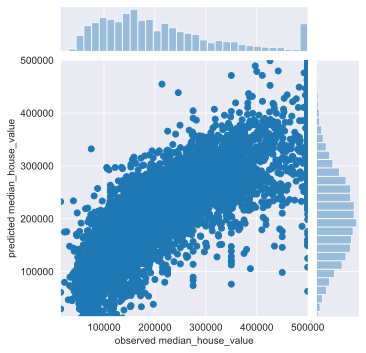

In [10]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

lr = LinearRegression()
lr.fit(X_train_scaled,y_train_scaled)
b = lr.coef_
b0 = lr.intercept_
y_pred_train = yscaler.inverse_transform(lr.predict(X_train_scaled))
y_pred_test = yscaler.inverse_transform(lr.predict(X_test_scaled))

print("RMSE training fit: %.03f" %np.sqrt(mean_squared_error(y_train,y_pred_train)))
print("R2 training fit: %.03f " %r2_score(y_train,y_pred_train))
print("RMSE prediction: %.03f" %np.sqrt(mean_squared_error(y_test,y_pred_test)))
print("R2 prediction: %.03f " %r2_score(y_test,y_pred_test))

minlim = y_test.min()
maxlim = y_test.max()
# predicted/actual plot for test set
ax = sns.jointplot(x=y_test,y=y_pred_test.reshape(-1), height=5,xlim=(minlim,maxlim),ylim=(minlim,maxlim))
ax.ax_joint.set_xlabel('observed median_house_value')
ax.ax_joint.set_ylabel('predicted median_house_value')
plt.show()

## Principal Component Analysis

In the last lecture, it was shown that the pseudoinverse calculation for multivariate regression performs badly for ill conditioned matrices (where the determinant is close to zero/the columns are not linearly independent). One way to address this issue is the PCA Transformation, which also brings a lot of other interesting advantages to a machine learning problem.

A way to compute the PCA is the singular value decomposition. Instead of directly compute it by SVD we use the built-in function in sklearn. ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html))

In [11]:
from sklearn.decomposition import PCA
pca = PCA()
T_train = pca.fit_transform(X_train_scaled) 
data_pca = pd.DataFrame(columns=X_train.columns,data=X_train_scaled)
data_pca[['T1', 'T2', 'T3', 'T4','T5', 'T6','T7', 'T8', 'T9']] = pd.DataFrame(T_train)
data_pca.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,T1,T2,T3,T4,T5,T6,T7,T8,T9
0,0.855891,-0.844256,-0.450904,-0.116716,-0.319871,-0.282223,-0.238215,0.774205,-0.820120,-0.167450,-1.488401,0.936894,-0.198902,0.065118,-0.052891,0.025900,0.016959,0.065228
1,0.660664,-0.689725,-0.371382,1.141682,2.131765,1.089704,2.256040,-0.683096,-0.820120,3.407596,-0.707308,-0.921306,-0.519681,0.325299,-0.648030,0.673364,-0.294828,0.131890
2,1.086159,-0.727187,-0.609949,0.452168,0.306685,0.928250,0.569893,-0.008102,-0.116869,1.360754,-1.136897,-0.054311,0.035612,-0.416371,0.405335,-0.196748,-0.177456,0.151566
3,1.056124,-0.731870,-0.768994,0.238779,0.081220,0.910119,0.367866,-0.457189,-0.116869,1.053412,-1.156552,-0.333029,-0.255666,-0.692908,0.559107,-0.211554,-0.089704,0.152409
4,1.161246,-1.340629,0.264796,-0.279384,-0.032699,-0.392737,-0.038778,-0.361316,1.992883,-0.333411,-1.045073,-0.970052,1.890244,-1.333366,-0.209540,0.095718,-0.050461,0.045293


__Task__:We can use scree plots, as you already know it from the textbook and the lecture, to get an intuition of what could be the rank of our data. First we plot the sorted of the singular values and then the accumulated explained variance.

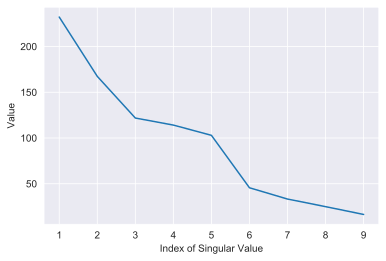

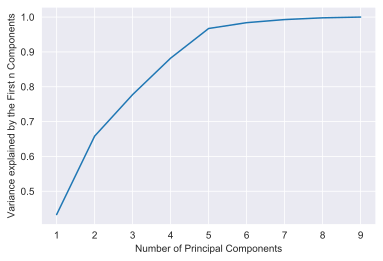

In [12]:
sval = pca.singular_values_ #gives you the sorted singular values
plt.figure()
### code a scree plot with singular values here
plt.plot(range(1,len(sval)+1),sval) ###
plt.xticks(range(1,len(sval)+1)) ###
plt.xlabel("Index of Singular Value")
plt.ylabel("Value")

expl_var = pca.explained_variance_ratio_ #gives you the explained variance by each component normalized by the total variance
plt.figure()
### scree plot goes here
sns.lineplot(x=np.arange(1,len(expl_var)+1),y=np.cumsum(expl_var))
plt.xlabel("Number of Principal Components")
plt.xticks(np.arange(1,len(expl_var)+1))
plt.ylabel("Variance explained by the First n Components")
plt.show()

A common way to extract information from PCA is to look at scatter plots of the scores (=transformed variables). This can help to find interesting samples, or even outliers, to see if there are clusters of samples and so on. This visual inspection is somehow constrained by the number of important components. This is why you will find many examples in textbooks with only two important components. From our scree plots above we can see that 5 components explain pretty all of the variance. This would mean we have to inspect 10 score plots. So we will only give an example by using the first 3 components to generate 3 plots. To extract more information and to relate the scores to our target, the _median_house_value_ is used as _hue_.

In [13]:
data_pca['median_house_value'] = y_train_scaled
plt.figure()
sns.scatterplot(x='T1',y='T2',hue='median_house_value', data=data_pca)
plt.figure()
sns.scatterplot(x='T1',y='T3',hue='median_house_value', data=data_pca)
plt.figure()
sns.scatterplot(x='T2',y='T3',hue='median_house_value', data=data_pca)
plt.show()

__Task:__ Try to interpret the plots. Do you find interesting data points? How is the scores relate to the _median_house_value_? (We will also discuss this in the next lecture)

Next, we are interested in how the original features contribute to each of the transformed variables. This can also help to get insights on which of the initial features might be important. (But keep in mind that in this case important does not mean important for the prediction of the _median_house_value_. PCA is an unsupervised technique and _median_house_value_ is not used to find the transformation.)

To acount for different magnitudes it is also very common to use the so called _correlation loadings_ instead of the plain loadings. The correlation loadings can either be determined from the loadings itself or by computing the pearson correlaiton between each variable and each score. 

In [14]:
corL = data_pca.corr()
corL.drop(corL.columns[:-10],axis=1,inplace=True)
corL.drop(corL.index[9:],axis=0,inplace=True)
corL

,T1,T2,T3,T4,T5,T6,T7,T8,T9,median_house_value
longitude,0.149921,-0.954761,-0.100329,0.098293,-0.124550,-0.041306,-0.126239,-0.113770,0.011352,-0.039302
latitude,-0.144052,0.933409,0.081009,-0.263495,0.062265,-0.026298,-0.118518,-0.115353,0.009102,-0.148088
housing_median_age,-0.433239,0.049002,-0.441412,0.420038,0.661592,-0.018090,-0.022934,-0.008358,-0.000067,0.106748
total_rooms,0.954671,0.115331,0.089364,0.087296,0.068501,-0.116718,-0.169496,0.111306,0.016188,0.133735
total_bedrooms,0.965901,0.097830,-0.122995,0.030097,0.038878,-0.152058,0.071908,-0.050583,-0.095228,0.049876
population,0.931156,0.041687,-0.117967,0.007105,0.089939,0.327674,-0.034890,-0.013142,-0.019890,-0.022254
households,0.970165,0.103323,-0.115161,0.042468,0.066735,-0.054037,0.117408,-0.047793,0.097960,0.065889
median_income,0.083603,-0.053024,0.881015,0.400786,0.226583,0.019531,0.020153,-0.035177,-0.004241,0.687118
ocean_proximity,-0.089809,0.449772,-0.187914,0.717626,-0.488665,0.016211,-0.013058,-0.010694,0.000619,0.080266


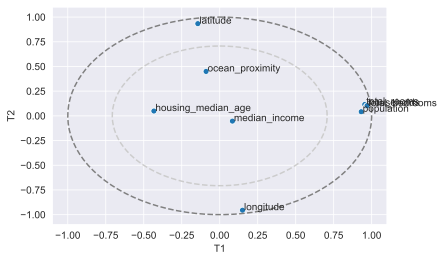

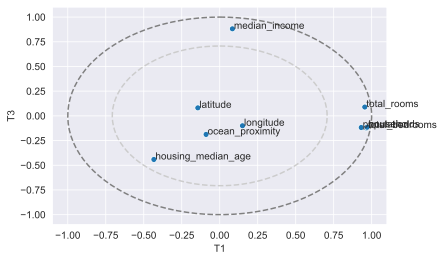

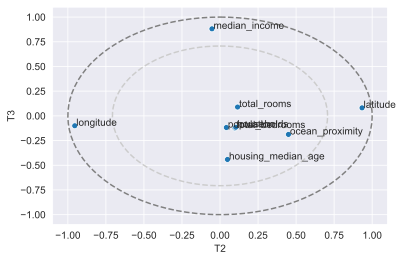

In [15]:
sns.scatterplot(x='T1', y='T2', data=corL)
plt.plot(np.sin(np.linspace(0,2*np.pi,100)),np.cos(np.linspace(0,2*np.pi,100)),'--',color='.5')
plt.plot(np.sqrt(0.5)*np.sin(np.linspace(0,2*np.pi,100)),np.sqrt(.5)*np.cos(np.linspace(0,2*np.pi,100)), '--', color='.8')
for kk,nme in enumerate(corL.index):
     plt.annotate(nme,(corL.T1.values[kk]+.01,corL.T2.values[kk]))
plt.ylim(-1.1,1.1)
plt.xlim(-1.1,1.1)
plt.figure()
sns.scatterplot(x='T1', y='T3', data=corL)
plt.plot(np.sin(np.linspace(0,2*np.pi,100)),np.cos(np.linspace(0,2*np.pi,100)),'--',color='.5')
plt.plot(np.sqrt(0.5)*np.sin(np.linspace(0,2*np.pi,100)),np.sqrt(.5)*np.cos(np.linspace(0,2*np.pi,100)), '--', color='.8')
for kk,nme in enumerate(corL.index):
     plt.annotate(nme,(corL.T1.values[kk]+.01,corL.T3.values[kk]))
plt.ylim(-1.1,1.1)
plt.xlim(-1.1,1.1)
plt.show()
plt.figure()
sns.scatterplot(x='T2', y='T3', data=corL)
plt.plot(np.sin(np.linspace(0,2*np.pi,100)),np.cos(np.linspace(0,2*np.pi,100)),'--',color='.5')
plt.plot(np.sqrt(0.5)*np.sin(np.linspace(0,2*np.pi,100)),np.sqrt(.5)*np.cos(np.linspace(0,2*np.pi,100)), '--', color='.8')
for kk,nme in enumerate(corL.index):
     plt.annotate(nme,(corL.T2.values[kk]+.01,corL.T3.values[kk]))
plt.ylim(-1.1,1.1)
plt.xlim(-1.1,1.1)
plt.show()

__Task:__ Try to interpret the plots. What can you say about the different features? Find the correlations between features and principal components. (We will also discuss this in the next lecture)

After this interpretations and diagnostics we will use the PCA as an initial step in our predictive modeling process. Depending on the number of the principal components this might either erase noise (good!) or leave out important data (bad!). In order to find the optimal number of principle components to improve our regression, we can use a grid search. Sklearn has a package for this called `GridSearchCV` ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)), which performs grid search and cross validation in one step. Instead of doing manual LOOCV like last week, we will use sklearns `Kfold`([doc](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html)) class to do 10-Fold cross validation. There is nothing for you to code here. Lean back, relax and try to understand it. We will cover this in the lecture. 

Besides the `GridSearchCV` the `Pipeline` architecture ([doc](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html)) is a very convenient tool provided in sklearn. It allows chaining (and also swapping) different process steps and regression algorithms easily. Play with the code below (uncomment and comment different parts) to see how different scaling, cross validation and regression algorithms affect the results. If you try out Ridge or Lasso make sure to change the `param_grid` to find the best _alpha_ or if you combine all to find the best number of components and _alpha_.

Best parameter RMSE=70572.415):
{'pca__n_components': 8}


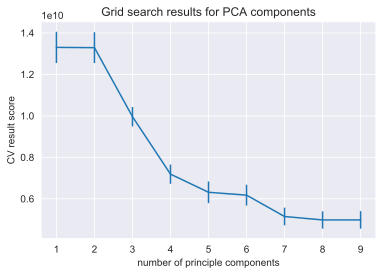

In [16]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, LeaveOneOut, GridSearchCV
from sklearn.preprocessing import RobustScaler, MinMaxScaler

### Scaling
scaler = StandardScaler()
#scaler = RobustScaler()
#scaler = MinMaxScaler()

# PCA
pca = PCA()


### Validation
#cval = LeaveOneOut() 
cval = KFold(n_splits=10)

### Estimator
estimator = LinearRegression()
# estimator = Ridge(alpha = 0.5)
# estimator = Lasso(alpha = 0.1)



pipe = Pipeline(steps=[('scaler',scaler),('pca', pca), ('estimator', estimator)])
param_grid = {'pca__n_components': range(1,X_train.shape[1]+1)}


search = GridSearchCV(pipe, param_grid, n_jobs=-1,cv=cval,scoring='neg_mean_squared_error',return_train_score=True)
search.fit(X_train, y_train)
print("Best parameter RMSE=%0.3f):" % np.sqrt(-search.best_score_))
print(search.best_params_)

plt.figure()
plt.errorbar(range(1,X_train.shape[1]+1),-search.cv_results_['mean_test_score'],yerr=search.cv_results_['std_test_score'])
#plt.plot(range(1,X_train.shape[1]+1),-search.cv_results_['mean_train_score'])
plt.xticks(range(1,X_train.shape[1]+1))
plt.xlabel("number of principle components")
plt.ylabel("CV result score")
plt.title("Grid search results for PCA components")
plt.show()

Let us now see what it has been good for:

RMSE training fit: 70367.278
R2 training fit: 0.629 
RMSE prediction: 68302.992
R2 prediction: 0.648 


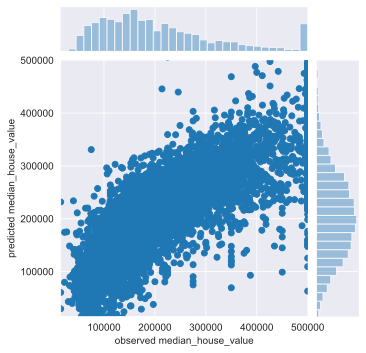

In [17]:
best_estimator = search.best_estimator_
y_pred_train = best_estimator.predict(X_train)
y_pred_test = best_estimator.predict(X_test)

print("RMSE training fit: %.03f" %np.sqrt(mean_squared_error(y_train,y_pred_train)))
print("R2 training fit: %.03f " %r2_score(y_train,y_pred_train))
print("RMSE prediction: %.03f" %np.sqrt(mean_squared_error(y_test,y_pred_test)))
print("R2 prediction: %.03f " %r2_score(y_test,y_pred_test))

minlim = y_test.min()
maxlim = y_test.max()
# predicted/actual plot for test set
ax = sns.jointplot(x=y_test,y=y_pred_test, height=5,xlim=(minlim,maxlim),ylim=(minlim,maxlim))
ax.ax_joint.set_xlabel('observed median_house_value')
ax.ax_joint.set_ylabel('predicted median_house_value')
plt.show()

In [18]:
search.cv_results_

{'mean_fit_time': array([0.04831769, 0.03676474, 0.03159583, 0.02828498, 0.03149979,
        0.04051845, 0.05326869, 0.0249882 , 0.01385505]),
 'std_fit_time': array([0.0123575 , 0.00902102, 0.00248974, 0.00111691, 0.00200857,
        0.00722487, 0.00801816, 0.0108879 , 0.00173339]),
 'mean_score_time': array([0.00332329, 0.00295887, 0.00255275, 0.00241718, 0.00269792,
        0.00393589, 0.00396585, 0.0031709 , 0.00224645]),
 'std_score_time': array([0.00043567, 0.00065025, 0.00049769, 0.0004109 , 0.00070398,
        0.00334121, 0.00193881, 0.00032198, 0.00049635]),
 'param_pca__n_components': masked_array(data=[1, 2, 3, 4, 5, 6, 7, 8, 9],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'params': [{'pca__n_components': 1},
  {'pca__n_components': 2},
  {'pca__n_components': 3},
  {'pca__n_components': 4},
  {'pca__n_components': 5},
  {'pca__n_components': 6},
  {'pca__n_compon